In [1]:
# SETUP BLOCK - RUN THIS FIRST
import os
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

def plot_and_save(generator, model, fn_process_output, n_bins, path_prefix):
    """
    You have to set n_bins to something (anything) if you're doing regression.
    (this is a design flaw of the function to always request n_bins)
    """
    for i in range(20):
        feature, label = next(generator)
    
        if n_bins is None:
            prediction = model.predict(np.array([feature]))[0]
        else:
            prediction = model.predict_classes(np.array([feature]))[0]
        ground_truth = fn_process_output(feature, label, np.shape(label), n_bins)
        ground_truth_colors = fn_process_output(np.zeros(feature.shape) + 127, label, np.shape(label), n_bins)
        output = fn_process_output(feature, prediction, np.shape(label), n_bins)
        output_colors = fn_process_output(np.zeros(feature.shape) + 127, prediction, np.shape(label), n_bins)

        plt.figure(figsize=(20, 5))
        plt.subplot(1, 5, 1)
        plt.imshow(ground_truth)
        plt.title("ground truth")

        plt.subplot(1, 5, 2)
        plt.imshow(ground_truth_colors)
        plt.title("ground truth colors")

        plt.subplot(1, 5, 3)
        plt.imshow(feature[:, :, 0], cmap="gray")
        plt.title("model input")

        plt.subplot(1, 5, 4)
        plt.imshow(output)
        plt.title("model output")

        plt.subplot(1, 5, 5)
        plt.imshow(output_colors)
        plt.title("model output colors")
        plt.savefig(path_prefix + "/result_{}".format(i))

<h1> 2D bins Classification </h1>

<h2> Custom Tiny Model - For CIFAR-10 </h2>

In [21]:
from models import get_tiny_model
from utils import cifar_10_train_data_generator

n_bins = 13

model = get_tiny_model(resolution=32, n_classes=n_bins**2, is_regression=False)
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy')
model.load_weights("weights/classification_2d/cifar10/tiny_cla0930_loss1.737.h5")

gen = cifar_10_train_data_generator("cifar-10-batches-py", n_bins=n_bins, seed=0)

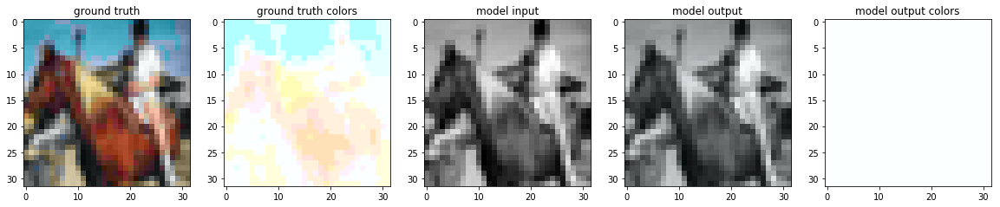

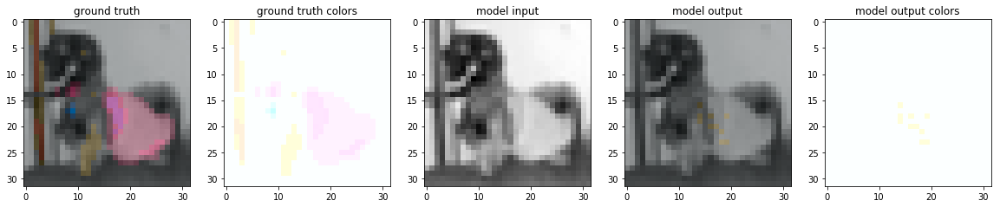

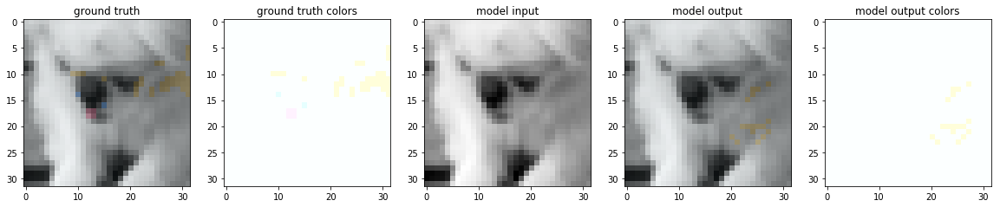

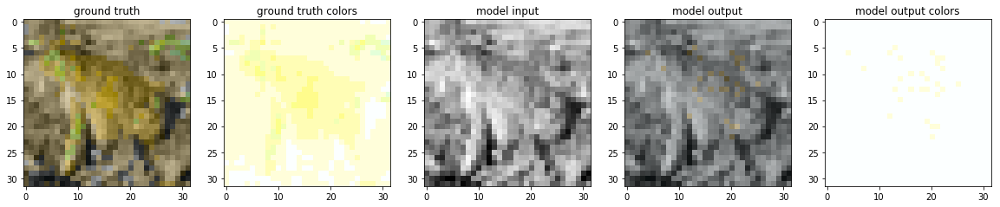

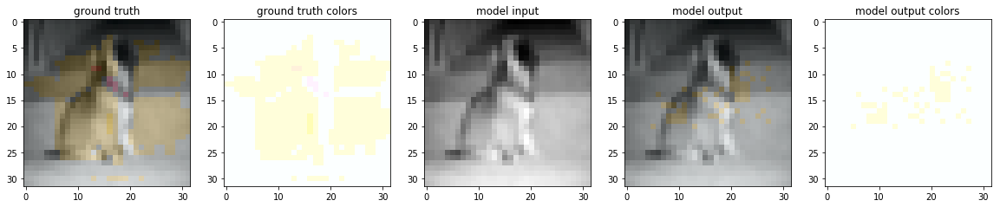

...

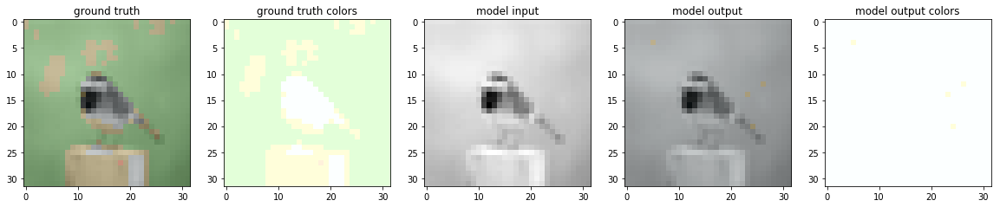

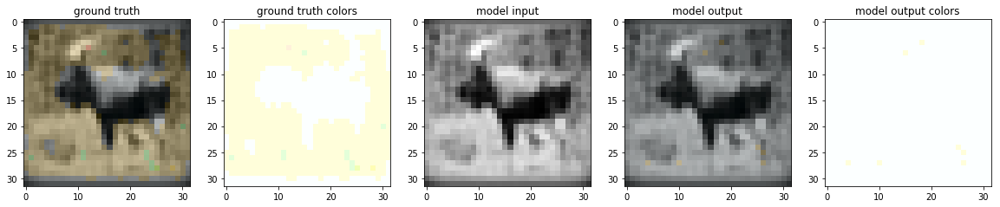

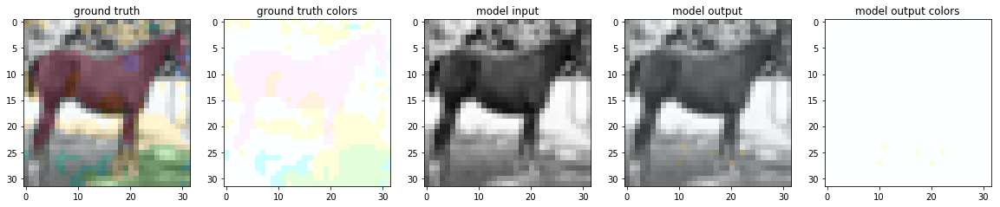

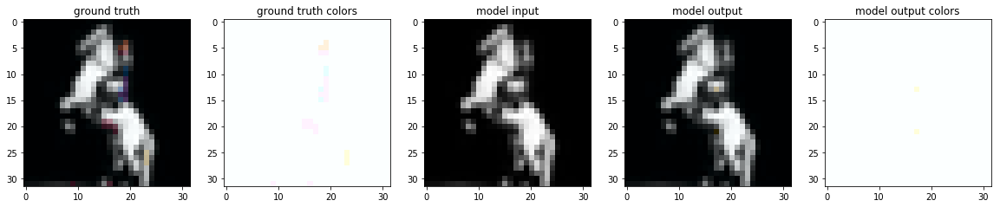

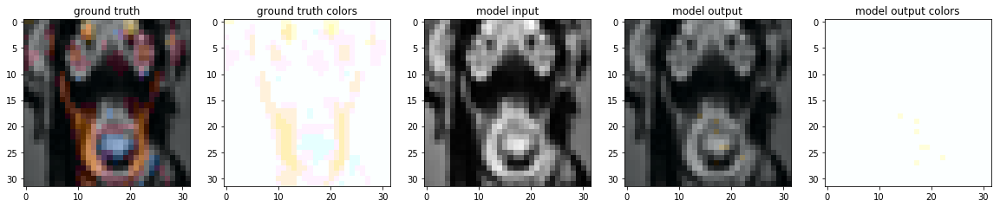

In [23]:
from utils import process_output

gen = cifar_10_train_data_generator("cifar-10-batches-py", n_bins=n_bins, seed=0)
plot_and_save(gen, model, process_output, n_bins=n_bins,
              path_prefix="results/classification/cifar-10/tiny")

<h2> Paper Model - For CIFAR-10 </h2>

In [33]:
from models import get_model
from utils import cifar_10_train_data_generator

n_bins = 25

model = get_model(resolution=32, n_classes=n_bins**2, is_regression=False)
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy')
model.load_weights("weights/classification_2d/cifar10/paper_weights00000200.h5")

gen = cifar_10_train_data_generator("cifar-10-batches-py", n_bins=n_bins, seed=0)

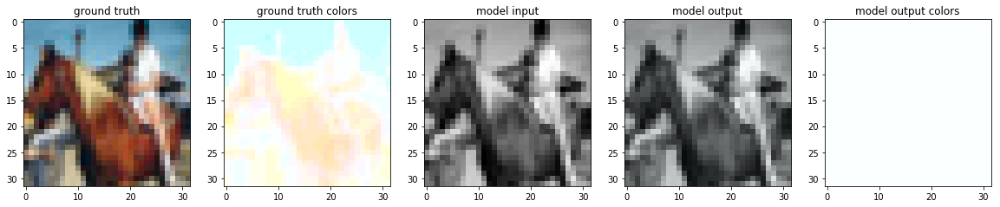

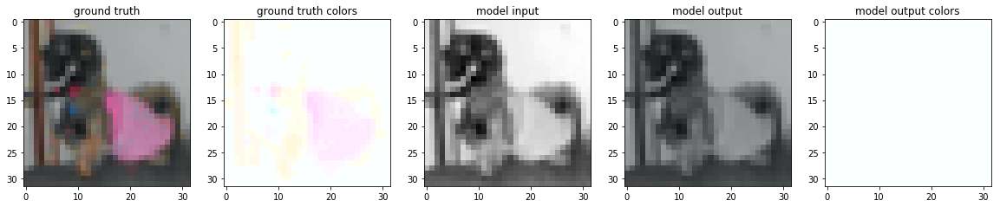

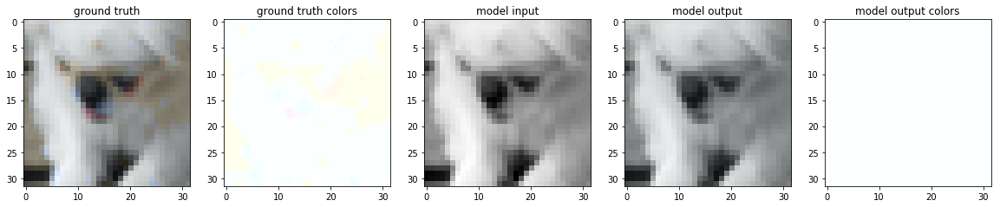

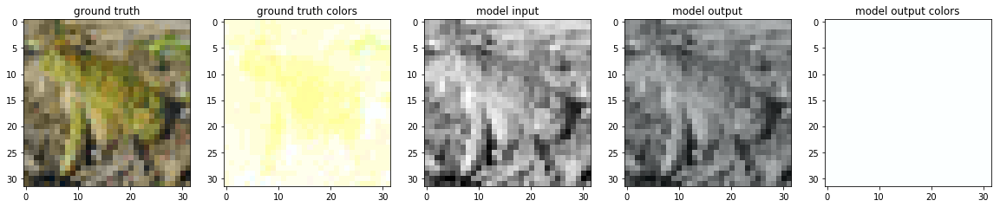

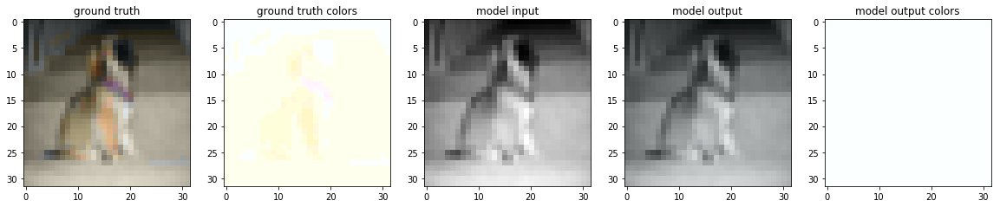

...

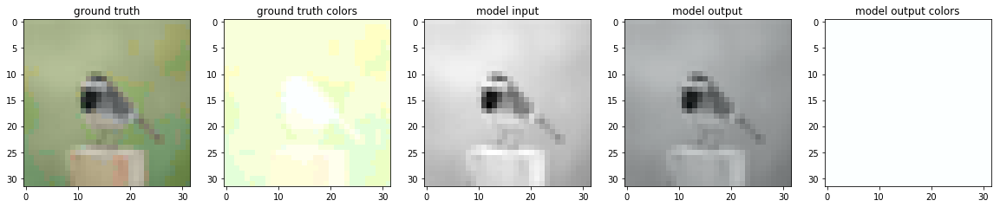

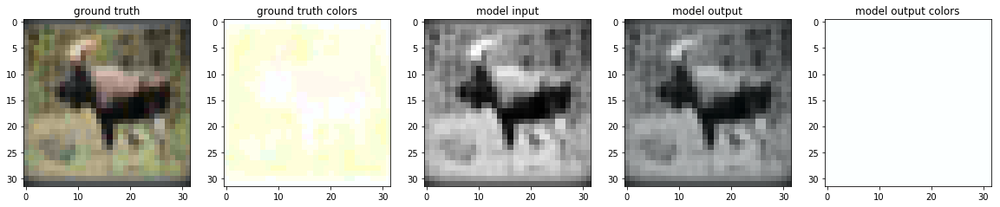

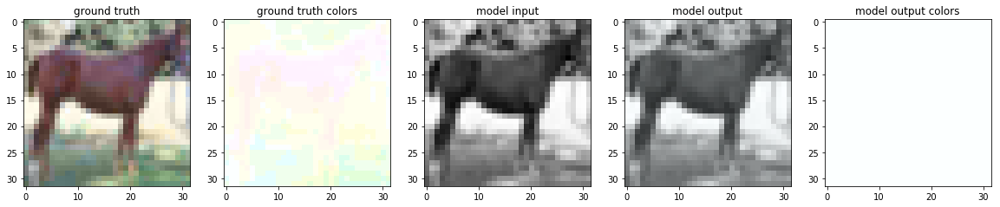

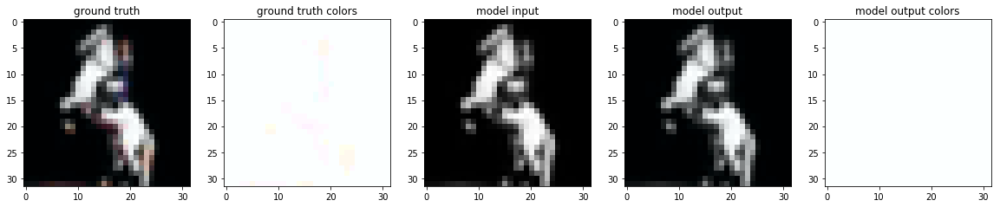

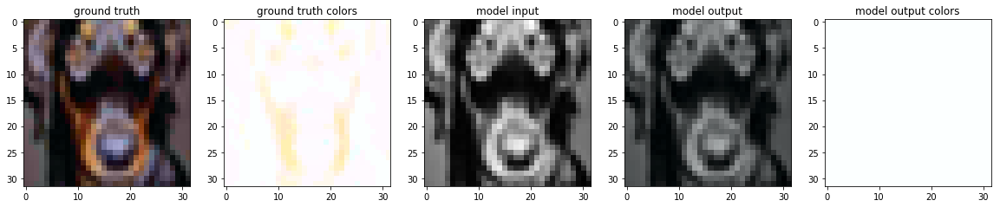

In [34]:
from utils import process_output

plot_and_save(gen, model, process_output, n_bins=n_bins,
              path_prefix="results/classification/cifar-10/paper")

<h2>Paper Model - For IMAGENET</h2>
<h3>Resolution (256, 256)</h3>

In [27]:
from models import get_model
from utils import data_generator

resolution = 256
n_bins = 13

model = get_model(resolution=resolution, n_classes=n_bins**2, is_regression=False)
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy')
model.load_weights("weights/classification_2d/imagenet/256/paper_cla0006_loss2.h5")

gen = data_generator("val", resolution=resolution, n_bins=n_bins, seed=0)

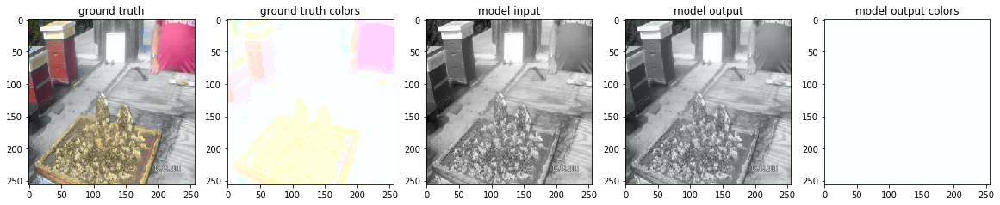

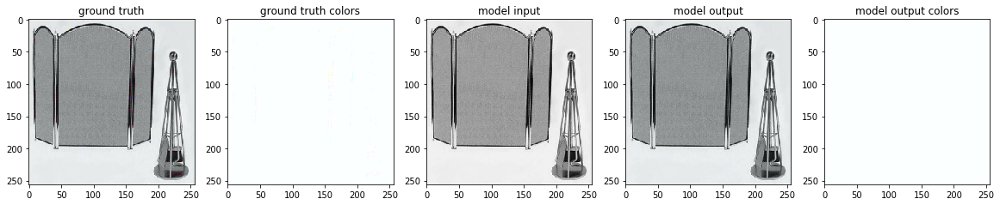

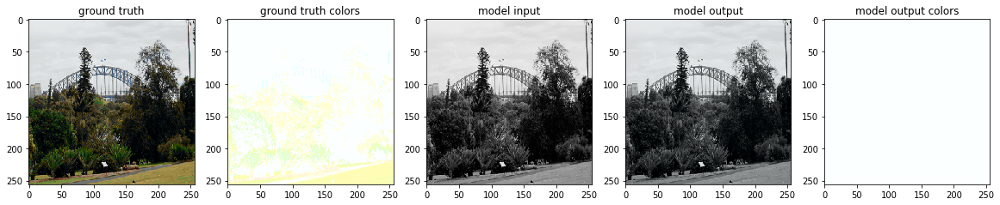

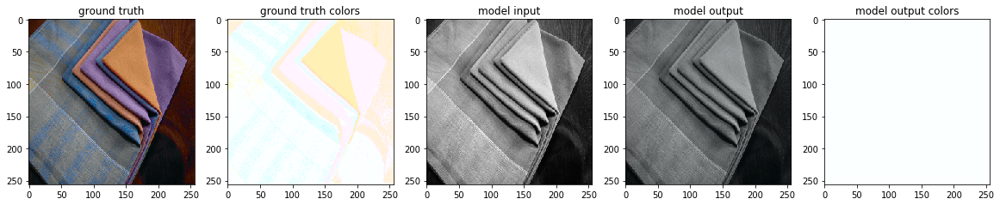

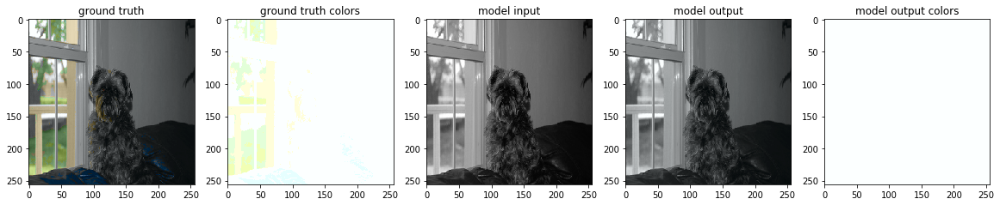

...

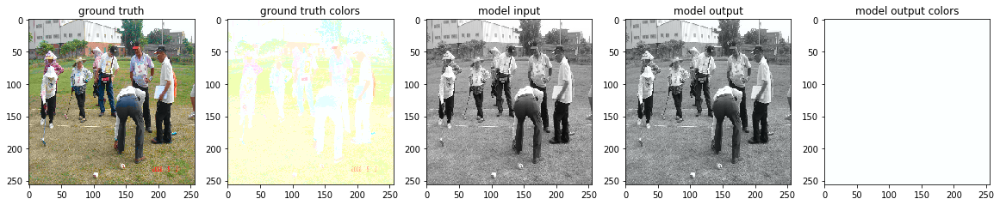

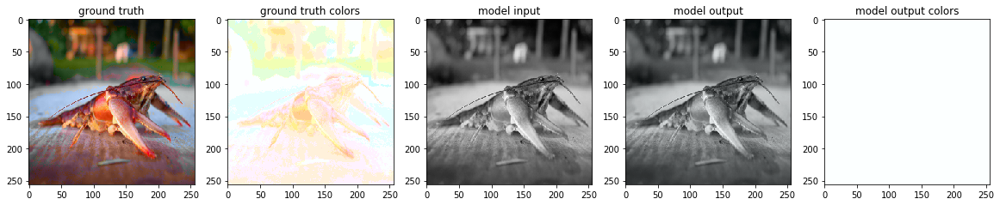

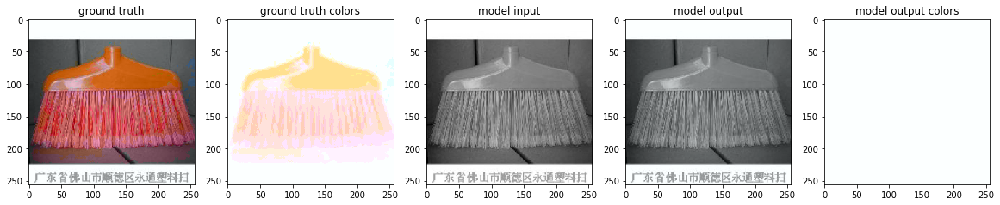

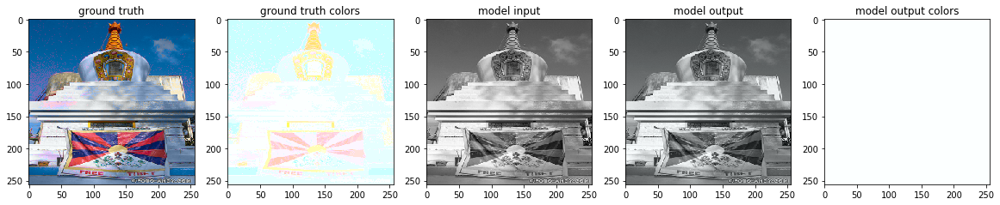

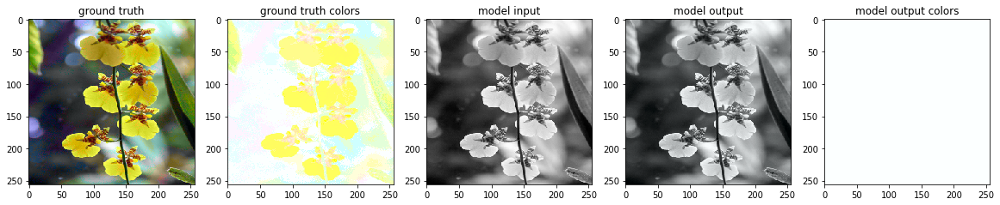

In [28]:
from utils import process_output

plot_and_save(gen, model, process_output, n_bins=n_bins,
              path_prefix="results/classification/imagenet/256")

<h1> Regression </h1>

<h2>Paper Model - For Cifar-10</h2>

In [38]:
from models import get_model
from utils import cifar_10_train_data_generator

model = get_model(resolution=32, is_regression=True)
model.compile(optimizer='adam',
              loss='mean_squared_error')
model.load_weights("weights/regression/cifar-10/paper_reg0046_loss166.h5")

gen = cifar_10_train_data_generator("cifar-10-batches-py", is_regression=True, seed=0)

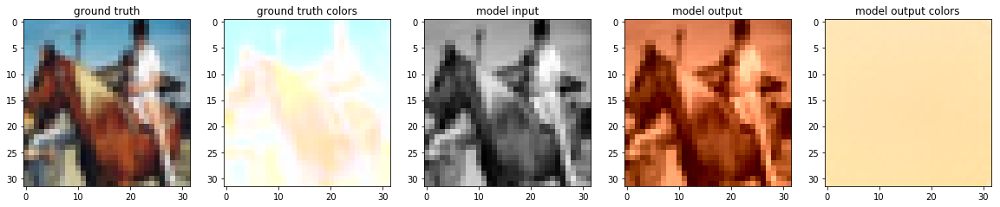

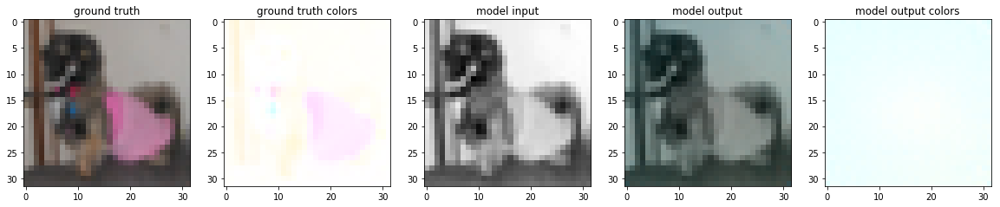

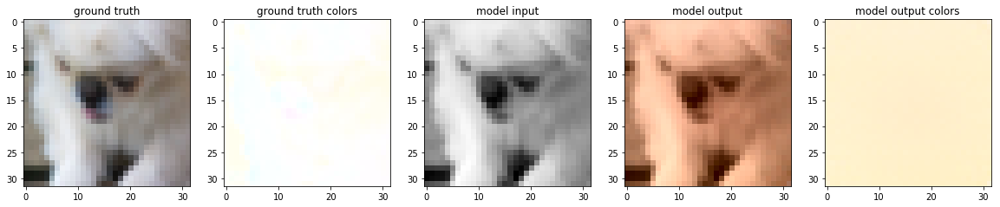

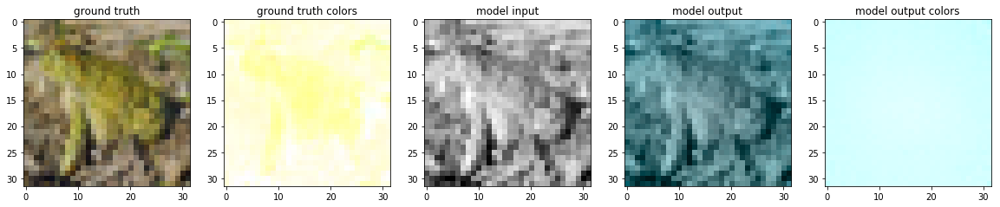

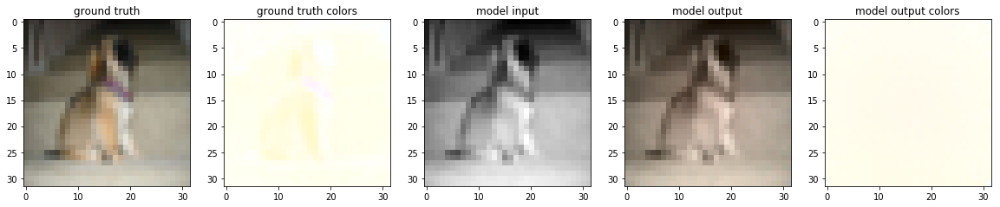

...

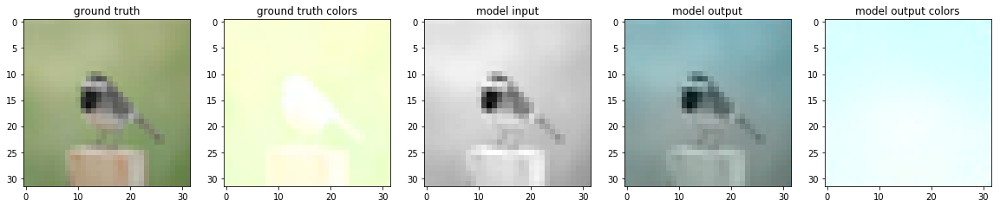

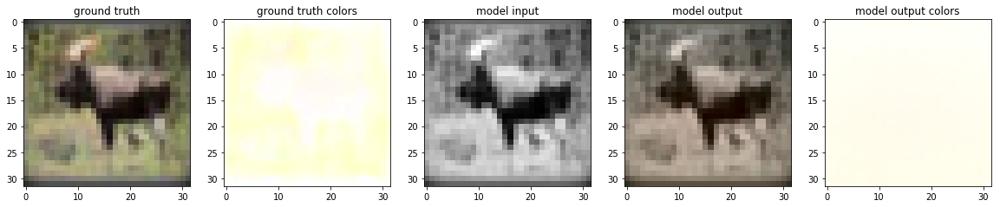

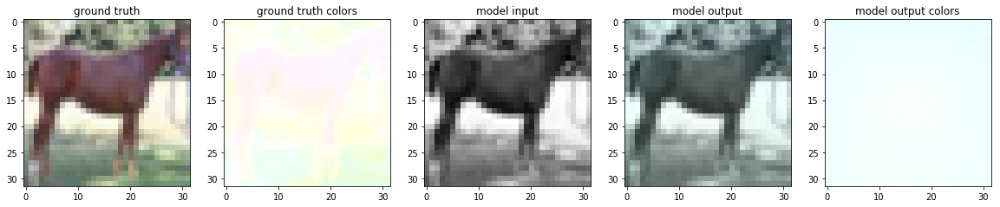

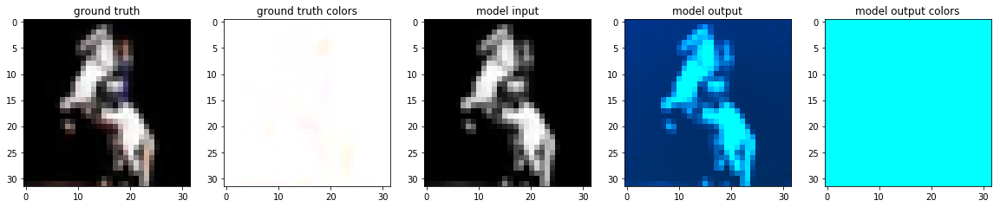

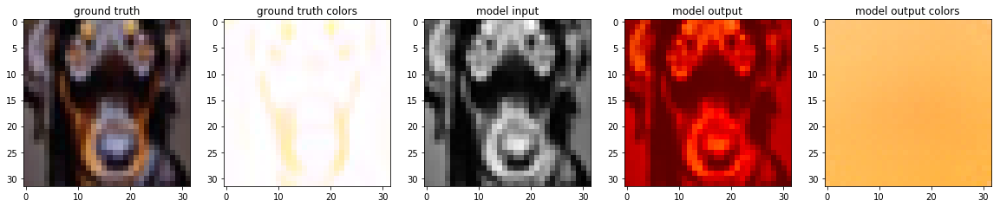

In [39]:
from utils import process_output_regression

plot_and_save(gen, model, process_output_regression, n_bins=None,
              path_prefix="results/regression/cifar-10")

<h2>Paper Model - For Imagenet</h2>
<h3>Resolution (104, 104)</h3>

In [40]:
from models import get_model
from utils import data_generator

resolution = 104

model = get_model(resolution, is_regression=True)
model.compile(optimizer='adam',
              loss='mean_squared_error')
model.load_weights("weights/regression/imagenet/{}/paper_reg_weights00000045.h5".format(resolution))

gen = data_generator("val", resolution=resolution, is_regression=True, seed=0)

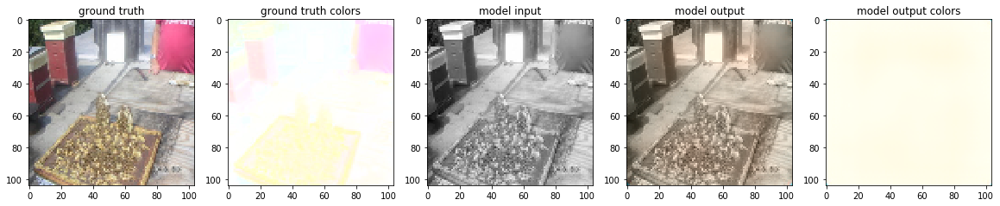

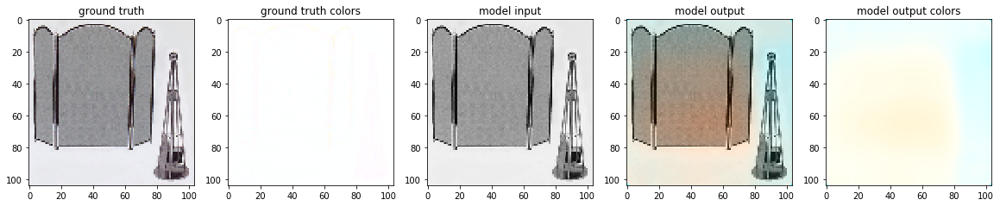

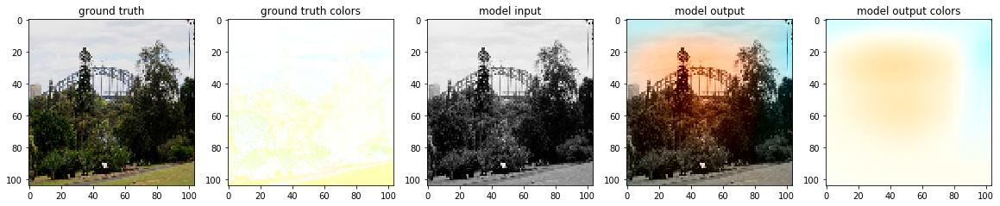

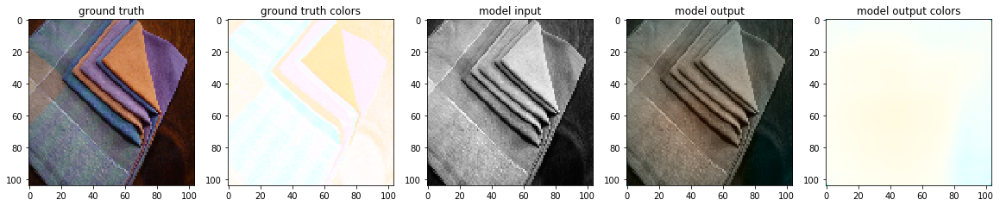

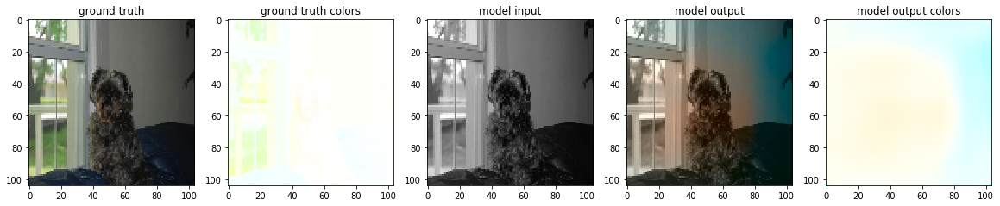

...

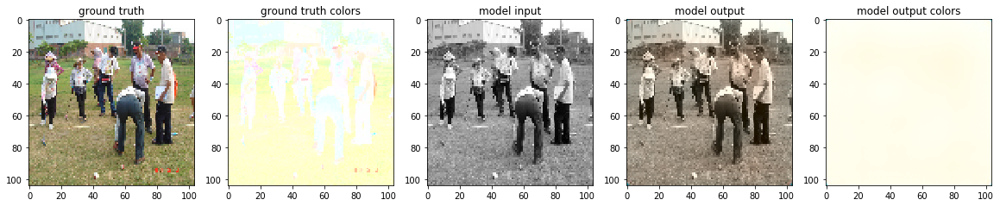

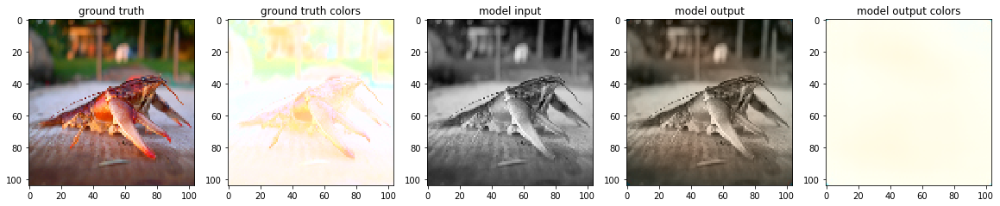

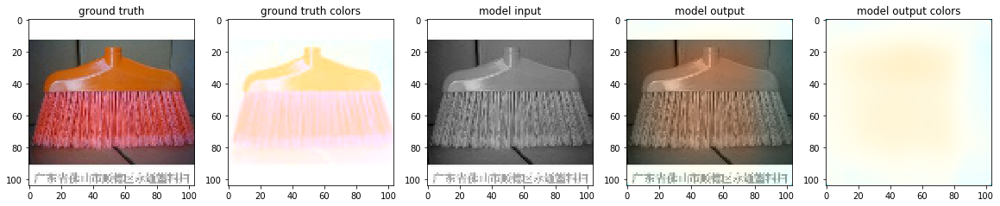

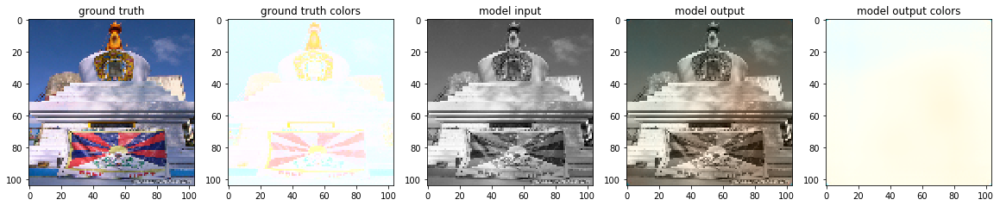

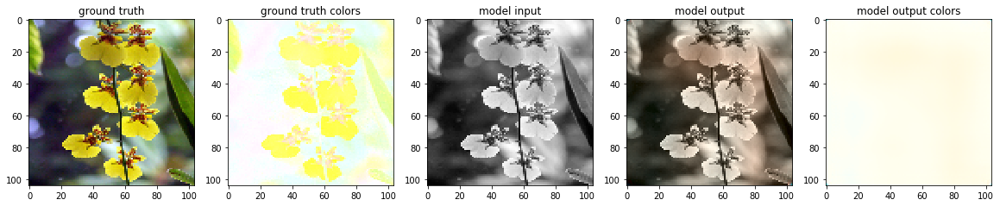

In [41]:
from utils import process_output_regression

plot_and_save(gen, model, process_output_regression, n_bins=None,
              path_prefix="results/regression/imagenet/{}".format(resolution))

<h3>Resolution (256, 256)</h3>

In [31]:
from models import get_model
from utils import data_generator

resolution = 256

model = get_model(resolution, is_regression=True)
model.compile(optimizer='adam',
              loss='mean_squared_error')
model.load_weights("weights/regression/imagenet/{}/paper_reg0016_loss347.h5".format(resolution))

gen = data_generator("val", resolution=resolution, is_regression=True, seed=0)

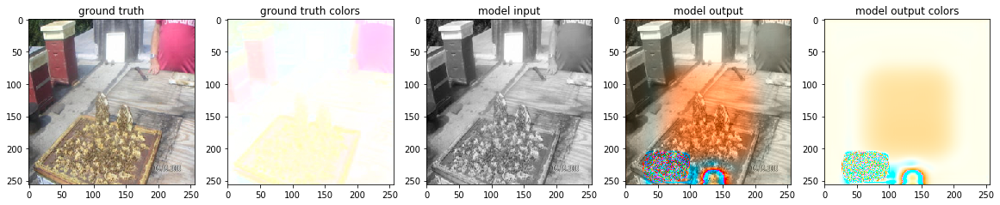

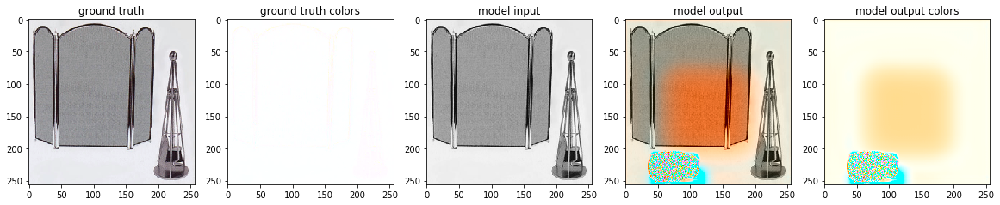

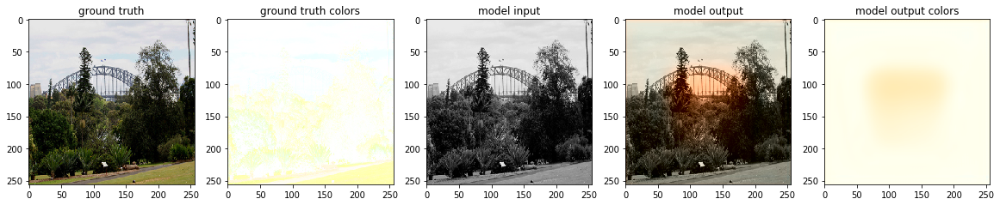

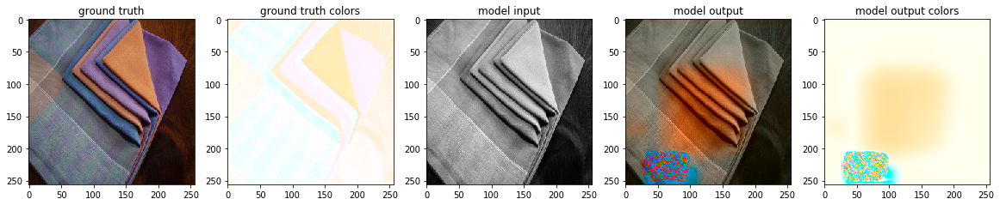

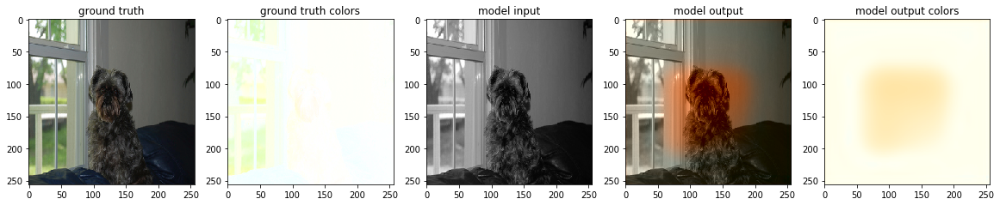

...

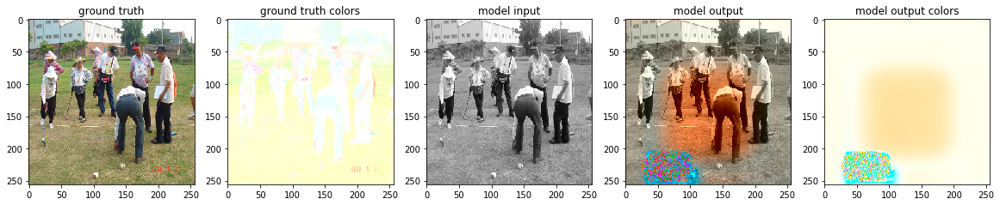

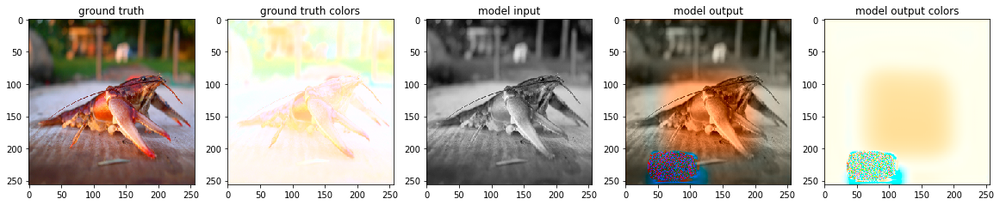

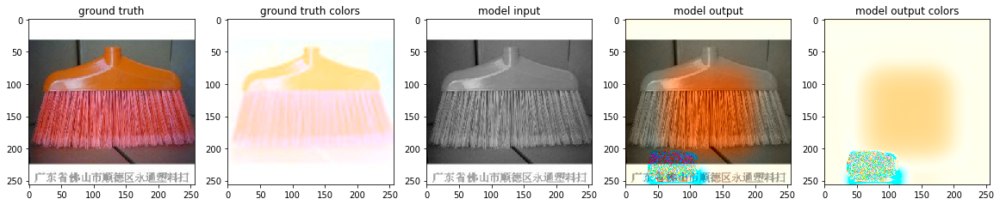

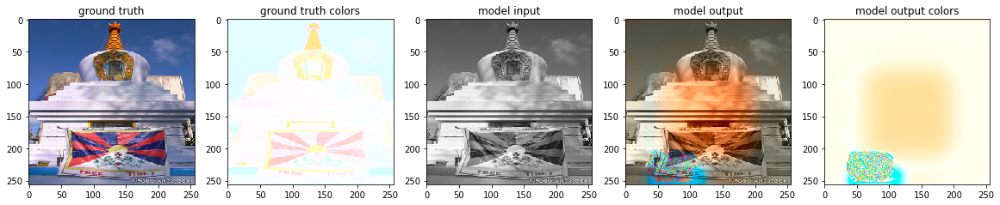

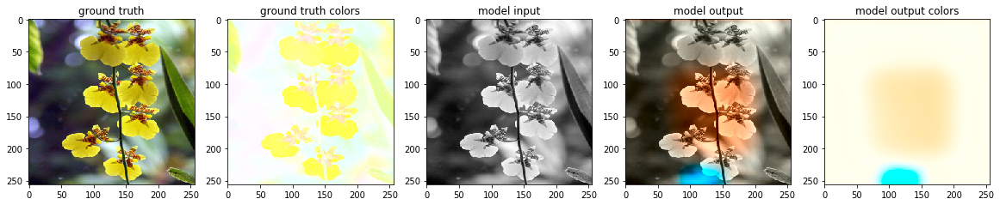

In [32]:
from utils import process_output_regression

plot_and_save(gen, model, process_output_regression, n_bins=None,
              path_prefix="results/regression/imagenet/{}".format(resolution))